In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
from torch.utils.data import Dataset, DataLoader
from torch import nn
from torch.nn.functional import relu
from scipy.io import loadmat
import os
from os import listdir
import pandas as pd
from skimage import io
from PIL import Image
from sklearn.metrics import confusion_matrix
import seaborn as sn
import pickle

from utils import *

In [2]:
CH = 'all'
device = torch.device('cuda')
val_dates = ['180328','180329']
test_dates = ['180330','180331']
load_path = '/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/'
save_path = '/mnt/pesaranlab/People/Capstone_students/Yue/model/model_Goose_1st_2_upsample'

train_files, val_files, test_files = create_files(load_path, val_dates, test_dates)
train_loader, val_loader, test_loader = create_dataloaders(train_files, val_files, test_files, load_path, batch_size=256)

In [3]:
len(train_loader), len(val_loader), len(test_loader)

(125, 11, 25)

In [4]:
for batch_idx, (data, label, date, rec, time) in enumerate(train_loader): # check shapes
    print(data.shape)
    print(label.shape)
    print(len(date))
    print(len(rec))
    print(len(time))
    break

torch.Size([256, 62, 100, 10])
torch.Size([256, 1])
256
256
256


date:180325, rec:002, time:3157.0, label:1.0
date:180324, rec:008, time:6054.0, label:0.0


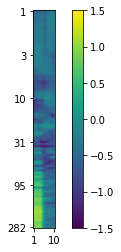

date:180327, rec:004, time:4984.0, label:1.0
date:180327, rec:005, time:5558.0, label:0.0


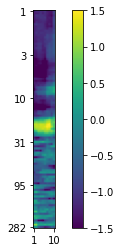

date:180322, rec:003, time:2698.0, label:1.0
date:180325, rec:005, time:604.0, label:1.0
date:180327, rec:005, time:2093.0, label:0.0


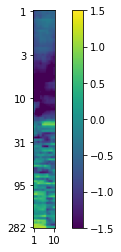

date:180327, rec:007, time:2720.0, label:0.0


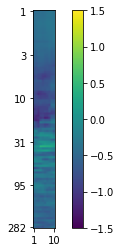

date:180325, rec:005, time:2546.0, label:1.0
date:180327, rec:001, time:2465.0, label:1.0
date:180327, rec:002, time:6565.0, label:1.0
date:180325, rec:001, time:3212.0, label:0.0


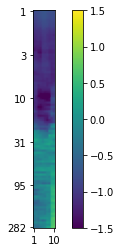

date:180323, rec:003, time:5171.0, label:1.0
date:180324, rec:006, time:1711.0, label:1.0
date:180327, rec:001, time:1450.0, label:0.0


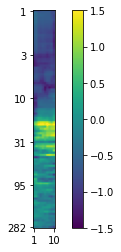

date:180325, rec:002, time:5228.0, label:1.0
date:180323, rec:004, time:4419.0, label:1.0
date:180401, rec:001, time:1280.0, label:0.0


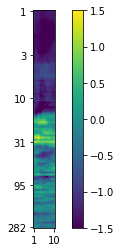

date:180323, rec:003, time:4871.0, label:1.0
date:180327, rec:006, time:660.0, label:1.0
date:180324, rec:008, time:1581.0, label:0.0


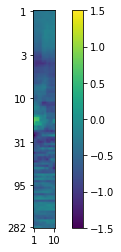

date:180323, rec:007, time:4812.0, label:0.0


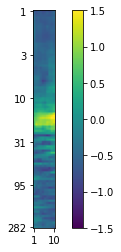

date:180401, rec:001, time:1460.0, label:0.0


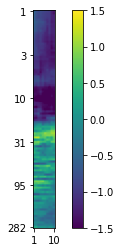

date:180325, rec:009, time:610.0, label:0.0


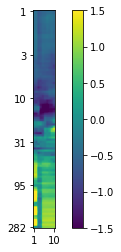

date:180324, rec:001, time:640.0, label:0.0


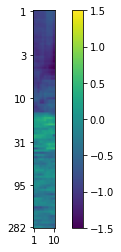

date:180327, rec:008, time:2682.0, label:0.0


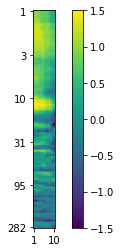

date:180327, rec:005, time:6552.0, label:0.0


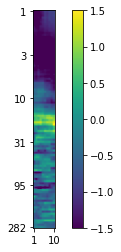

date:180401, rec:001, time:5377.0, label:0.0


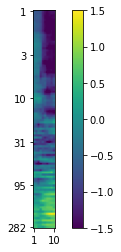

date:180325, rec:002, time:5008.0, label:1.0
date:180327, rec:007, time:5211.0, label:0.0


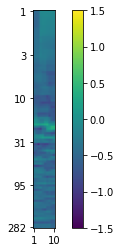

date:180326, rec:003, time:3409.0, label:1.0
date:180401, rec:001, time:5487.0, label:0.0


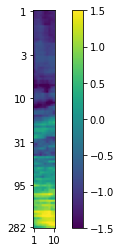

date:180327, rec:001, time:4551.0, label:1.0
date:180327, rec:007, time:4080.0, label:0.0


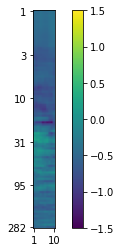

date:180323, rec:006, time:1506.0, label:1.0
date:180327, rec:008, time:4763.0, label:0.0


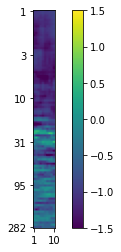

date:180401, rec:001, time:20.0, label:0.0


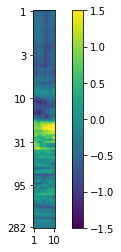

date:180322, rec:005, time:6364.0, label:1.0
date:180325, rec:009, time:5049.0, label:0.0


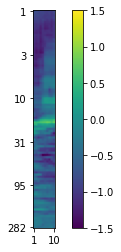

date:180322, rec:003, time:6236.0, label:1.0
date:180327, rec:008, time:2822.0, label:0.0


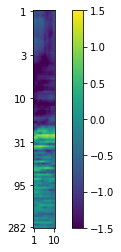

date:180322, rec:003, time:3148.0, label:1.0
date:180327, rec:008, time:4773.0, label:0.0


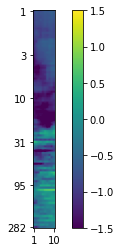

date:180323, rec:005, time:2127.0, label:1.0
date:180327, rec:007, time:1043.0, label:1.0
date:180325, rec:007, time:4913.0, label:0.0


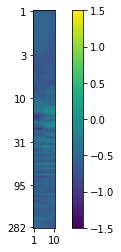

date:180327, rec:005, time:6238.0, label:0.0


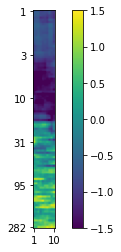

date:180327, rec:008, time:300.0, label:0.0


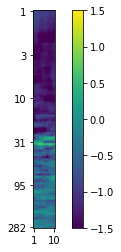

date:180327, rec:006, time:3586.0, label:1.0
date:180324, rec:003, time:3945.0, label:1.0
date:180324, rec:009, time:1007.0, label:0.0


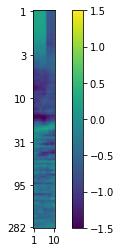

date:180324, rec:001, time:5450.0, label:0.0


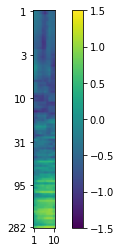

date:180325, rec:003, time:4358.0, label:1.0
date:180327, rec:005, time:2960.0, label:1.0
date:180327, rec:002, time:2470.0, label:1.0
date:180325, rec:005, time:4029.0, label:1.0
date:180327, rec:001, time:6912.0, label:0.0


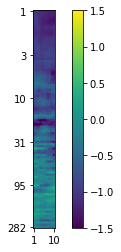

date:180323, rec:007, time:1939.0, label:0.0


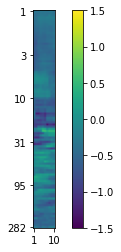

date:180327, rec:005, time:6482.0, label:0.0


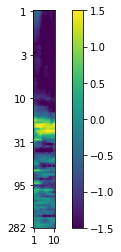

date:180401, rec:001, time:5437.0, label:0.0


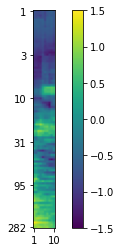

date:180327, rec:008, time:3882.0, label:0.0


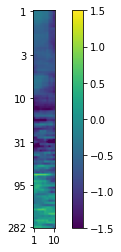

date:180401, rec:002, time:5652.0, label:1.0
date:180401, rec:002, time:4156.0, label:1.0
date:180323, rec:005, time:2707.0, label:1.0
date:180325, rec:003, time:4118.0, label:1.0
date:180325, rec:004, time:923.0, label:1.0
date:180323, rec:007, time:6361.0, label:0.0


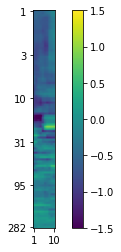

date:180325, rec:009, time:6540.0, label:0.0


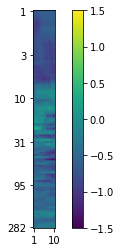

date:180324, rec:003, time:1266.0, label:1.0
date:180327, rec:007, time:6671.0, label:0.0


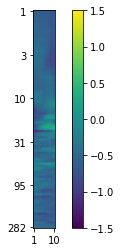

date:180327, rec:006, time:6211.0, label:1.0
date:180323, rec:002, time:4276.0, label:1.0
date:180324, rec:003, time:1176.0, label:1.0
date:180323, rec:001, time:850.0, label:0.0


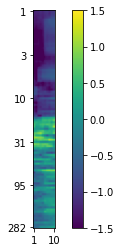

date:180322, rec:001, time:40.0, label:0.0


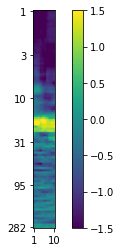

date:180325, rec:001, time:4196.0, label:1.0
date:180327, rec:006, time:770.0, label:1.0
date:180322, rec:002, time:3909.0, label:1.0
date:180325, rec:002, time:7159.0, label:1.0
date:180324, rec:008, time:2358.0, label:0.0


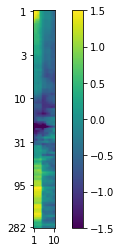

date:180324, rec:001, time:6159.0, label:1.0
date:180327, rec:007, time:3070.0, label:0.0


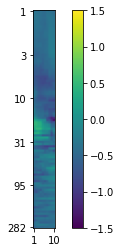

date:180324, rec:005, time:2874.0, label:1.0
date:180325, rec:001, time:1860.0, label:0.0


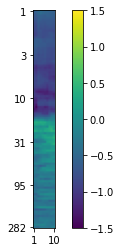

date:180325, rec:007, time:5903.0, label:0.0


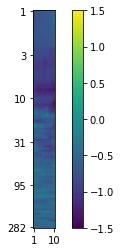

date:180324, rec:003, time:1499.0, label:1.0
date:180322, rec:003, time:5403.0, label:1.0
date:180327, rec:008, time:5723.0, label:0.0


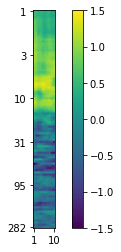

date:180325, rec:009, time:4959.0, label:0.0


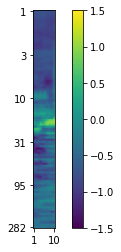

date:180325, rec:001, time:4396.0, label:1.0
date:180327, rec:007, time:1180.0, label:0.0


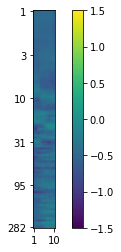

date:180325, rec:006, time:4435.0, label:1.0
date:180327, rec:006, time:4838.0, label:1.0
date:180325, rec:007, time:6113.0, label:0.0


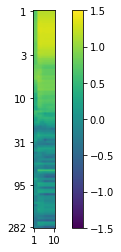

date:180324, rec:004, time:4239.0, label:1.0
date:180324, rec:008, time:4889.0, label:1.0
date:180325, rec:001, time:520.0, label:0.0


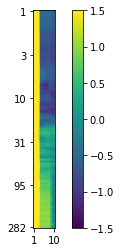

date:180327, rec:001, time:1390.0, label:0.0


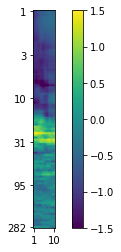

date:180324, rec:009, time:310.0, label:0.0


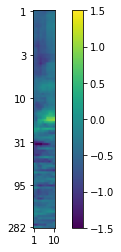

date:180327, rec:007, time:5971.0, label:0.0


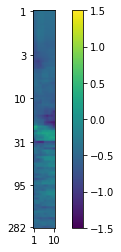

date:180325, rec:004, time:260.0, label:1.0
date:180327, rec:006, time:4047.0, label:1.0
date:180327, rec:008, time:4473.0, label:0.0


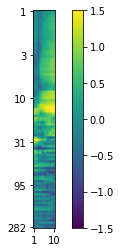

date:180324, rec:009, time:350.0, label:0.0


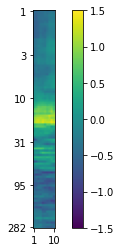

date:180326, rec:003, time:4666.0, label:0.0


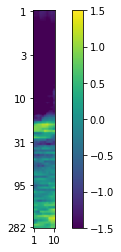

date:180327, rec:008, time:4463.0, label:0.0


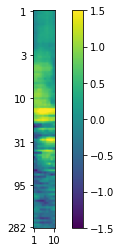

date:180325, rec:004, time:2574.0, label:1.0
date:180327, rec:008, time:450.0, label:0.0


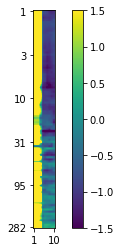

date:180327, rec:001, time:810.0, label:0.0


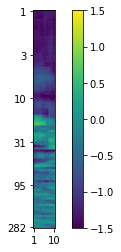

date:180323, rec:007, time:2189.0, label:0.0


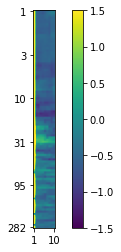

date:180325, rec:006, time:1259.0, label:1.0
date:180326, rec:004, time:6066.0, label:1.0
date:180401, rec:001, time:450.0, label:0.0


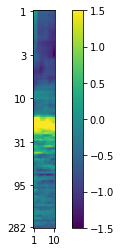

date:180325, rec:006, time:3473.0, label:1.0
date:180322, rec:003, time:3588.0, label:1.0
date:180401, rec:001, time:5913.0, label:1.0
date:180323, rec:003, time:4437.0, label:1.0
date:180324, rec:005, time:2834.0, label:1.0
date:180327, rec:007, time:3660.0, label:0.0


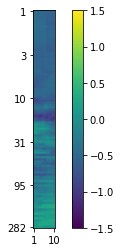

date:180327, rec:007, time:5951.0, label:0.0


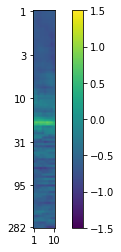

date:180324, rec:001, time:1672.0, label:1.0
date:180401, rec:001, time:920.0, label:0.0


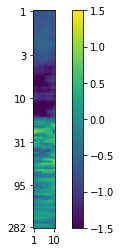

date:180327, rec:007, time:3490.0, label:0.0


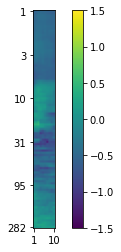

date:180327, rec:008, time:1542.0, label:0.0


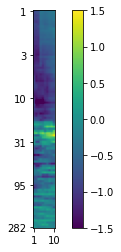

date:180324, rec:001, time:7017.0, label:1.0
date:180322, rec:004, time:6983.0, label:1.0
date:180327, rec:008, time:1582.0, label:0.0


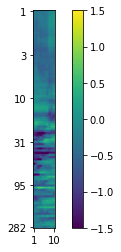

date:180325, rec:003, time:6944.0, label:1.0


In [4]:
# movement labelled 0; non-movement labelled 1
for batch_idx, (data, label, date, rec, time) in enumerate(train_loader):
    for i in range(128):
        print('date:{}, rec:{}, time:{}, label:{}'.format(date[i], rec[i], time[i], label[i][0].numpy()))
        if label[i][0].numpy() == 0.0:
            data_sub = data[i][0]
            plt.yticks(ticks=[0, 20, 40, 60, 80, 99], labels=[round(np.logspace(0, 2.45, 100)[i]) for i in [0, 20, 40, 60, 80, 99]])
            plt.xticks(ticks=[0, 9], labels=[1, 10])
            plt.imshow(data_sub)
            plt.clim(-1.5, 1.5)
            plt.colorbar()
            plt.show()
    break

date:180327, rec:007, time:7111.0, label:0.0
date:180324, rec:008, time:5954.0, label:0.0
date:180324, rec:008, time:1571.0, label:0.0
date:180324, rec:001, time:2321.0, label:1.0


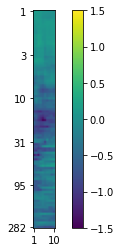

date:180325, rec:009, time:2590.0, label:0.0
date:180325, rec:001, time:3940.0, label:1.0


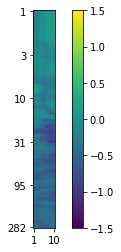

date:180327, rec:008, time:130.0, label:0.0
date:180401, rec:001, time:1250.0, label:0.0
date:180322, rec:003, time:1193.0, label:1.0


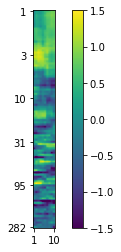

date:180324, rec:009, time:730.0, label:0.0
date:180325, rec:005, time:5983.0, label:1.0


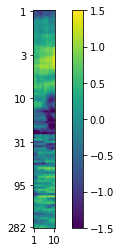

date:180324, rec:008, time:3583.0, label:0.0
date:180322, rec:003, time:6536.0, label:1.0


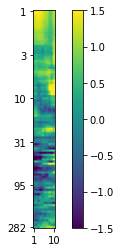

date:180327, rec:008, time:5233.0, label:0.0
date:180325, rec:001, time:610.0, label:0.0
date:180401, rec:003, time:410.0, label:1.0


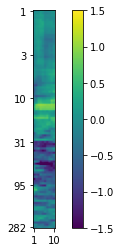

date:180323, rec:007, time:3095.0, label:0.0
date:180322, rec:005, time:2492.0, label:1.0


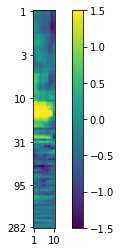

date:180326, rec:003, time:2999.0, label:1.0


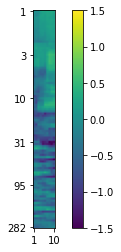

date:180324, rec:005, time:2220.0, label:1.0


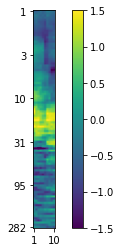

date:180324, rec:004, time:2639.0, label:1.0


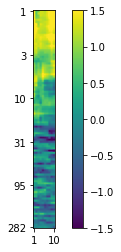

date:180325, rec:001, time:840.0, label:0.0
date:180326, rec:003, time:4736.0, label:0.0
date:180324, rec:008, time:2628.0, label:0.0
date:180327, rec:007, time:3260.0, label:0.0
date:180325, rec:004, time:2148.0, label:1.0


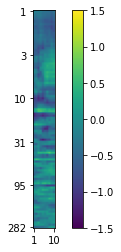

date:180327, rec:008, time:5433.0, label:0.0
date:180323, rec:007, time:7111.0, label:0.0
date:180327, rec:002, time:7115.0, label:1.0


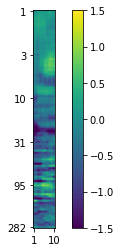

date:180327, rec:002, time:5334.0, label:1.0


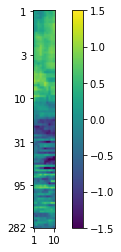

date:180324, rec:006, time:432.0, label:1.0


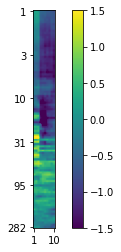

date:180324, rec:001, time:2537.0, label:0.0
date:180324, rec:006, time:6183.0, label:1.0


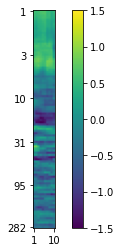

date:180327, rec:007, time:6641.0, label:0.0
date:180325, rec:007, time:4663.0, label:0.0
date:180325, rec:004, time:3720.0, label:1.0


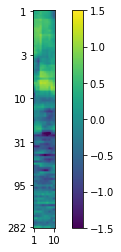

date:180325, rec:004, time:6237.0, label:1.0


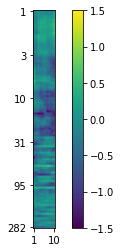

date:180325, rec:004, time:7010.0, label:1.0


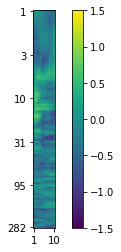

date:180327, rec:001, time:890.0, label:0.0
date:180327, rec:007, time:6951.0, label:0.0
date:180325, rec:009, time:1060.0, label:0.0
date:180325, rec:005, time:3528.0, label:1.0


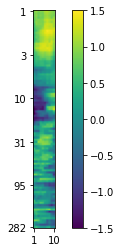

date:180324, rec:006, time:6353.0, label:1.0


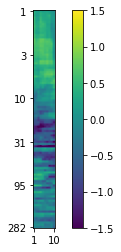

date:180324, rec:001, time:1276.0, label:1.0


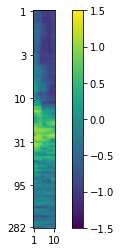

date:180325, rec:007, time:6373.0, label:0.0
date:180327, rec:007, time:1690.0, label:0.0
date:180323, rec:004, time:6531.0, label:1.0


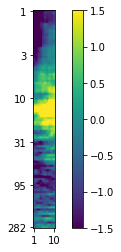

date:180322, rec:005, time:2901.0, label:1.0


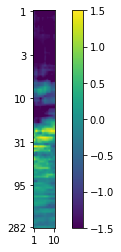

date:180327, rec:005, time:320.0, label:1.0


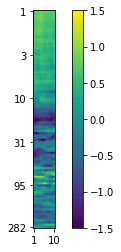

date:180401, rec:001, time:6513.0, label:1.0


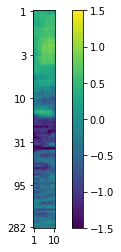

date:180323, rec:005, time:2207.0, label:1.0


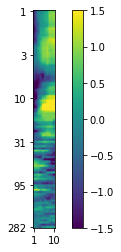

date:180324, rec:008, time:3623.0, label:0.0
date:180401, rec:001, time:6893.0, label:1.0


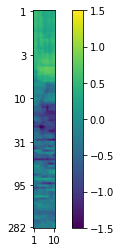

date:180327, rec:002, time:3891.0, label:0.0
date:180327, rec:004, time:2824.0, label:0.0
date:180325, rec:009, time:6500.0, label:0.0
date:180325, rec:007, time:5093.0, label:0.0
date:180324, rec:001, time:1832.0, label:1.0


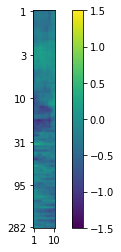

date:180325, rec:005, time:183.0, label:0.0
date:180327, rec:007, time:4230.0, label:0.0
date:180327, rec:001, time:4401.0, label:1.0


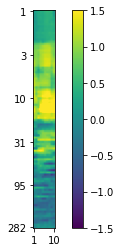

date:180322, rec:004, time:6283.0, label:1.0


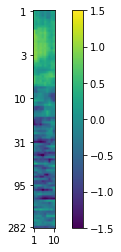

date:180325, rec:007, time:2946.0, label:0.0
date:180327, rec:004, time:1974.0, label:0.0
date:180324, rec:008, time:2638.0, label:0.0
date:180325, rec:005, time:3709.0, label:1.0


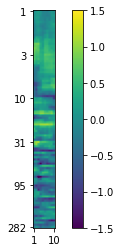

date:180327, rec:002, time:5324.0, label:1.0


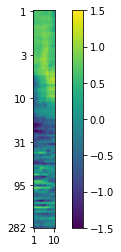

date:180324, rec:008, time:1841.0, label:0.0
date:180327, rec:008, time:470.0, label:0.0
date:180325, rec:009, time:6510.0, label:0.0
date:180323, rec:007, time:5264.0, label:0.0
date:180327, rec:005, time:1160.0, label:1.0


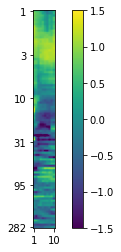

date:180322, rec:007, time:4670.0, label:0.0
date:180327, rec:008, time:4112.0, label:0.0
date:180401, rec:001, time:160.0, label:0.0
date:180327, rec:001, time:1870.0, label:0.0
date:180327, rec:008, time:50.0, label:0.0
date:180327, rec:004, time:2564.0, label:0.0
date:180327, rec:007, time:4471.0, label:0.0
date:180325, rec:009, time:1630.0, label:0.0
date:180324, rec:008, time:5244.0, label:0.0
date:180323, rec:002, time:5515.0, label:1.0


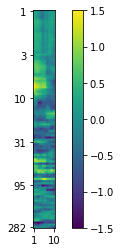

date:180327, rec:001, time:1910.0, label:0.0
date:180324, rec:008, time:5404.0, label:0.0
date:180327, rec:002, time:7015.0, label:1.0


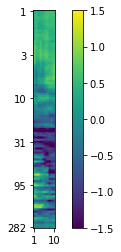

date:180327, rec:001, time:730.0, label:0.0
date:180327, rec:006, time:810.0, label:1.0


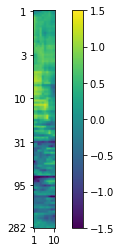

date:180324, rec:001, time:5370.0, label:0.0
date:180325, rec:009, time:590.0, label:0.0
date:180327, rec:007, time:3710.0, label:0.0
date:180323, rec:002, time:2126.0, label:1.0


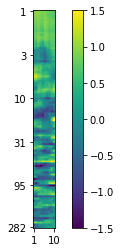

date:180326, rec:004, time:2899.0, label:1.0


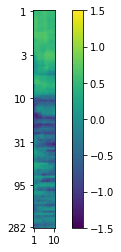

date:180324, rec:006, time:1182.0, label:1.0


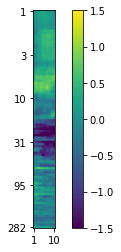

date:180325, rec:002, time:2755.0, label:1.0


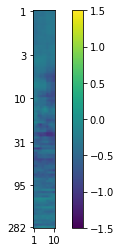

date:180324, rec:003, time:1859.0, label:1.0


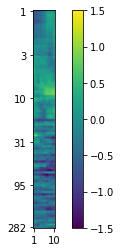

date:180322, rec:004, time:4019.0, label:1.0


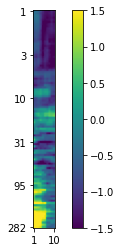

date:180323, rec:007, time:4281.0, label:0.0
date:180325, rec:007, time:4453.0, label:0.0
date:180327, rec:007, time:4080.0, label:0.0
date:180325, rec:007, time:4713.0, label:0.0
date:180327, rec:007, time:4050.0, label:0.0
date:180325, rec:003, time:2625.0, label:1.0


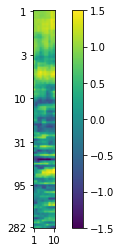

date:180323, rec:007, time:4662.0, label:0.0
date:180324, rec:009, time:1862.0, label:1.0


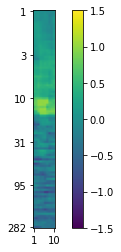

date:180324, rec:001, time:1802.0, label:1.0


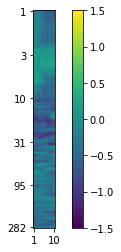

date:180327, rec:008, time:6679.0, label:1.0


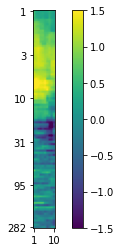

date:180401, rec:001, time:4827.0, label:1.0


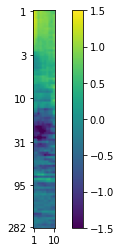

date:180325, rec:007, time:4953.0, label:0.0
date:180327, rec:005, time:5478.0, label:0.0
date:180327, rec:001, time:1920.0, label:0.0
date:180327, rec:008, time:2482.0, label:0.0
date:180324, rec:008, time:3383.0, label:0.0
date:180325, rec:007, time:2113.0, label:1.0


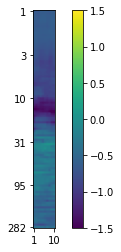

date:180323, rec:007, time:134.0, label:0.0
date:180324, rec:008, time:5604.0, label:0.0
date:180327, rec:001, time:2190.0, label:0.0
date:180327, rec:007, time:4931.0, label:0.0
date:180325, rec:009, time:4959.0, label:0.0
date:180324, rec:008, time:6034.0, label:0.0
date:180327, rec:008, time:3012.0, label:0.0
date:180325, rec:009, time:1730.0, label:0.0
date:180327, rec:001, time:1240.0, label:0.0
date:180323, rec:002, time:1377.0, label:1.0


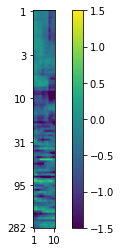

date:180325, rec:001, time:5276.0, label:1.0


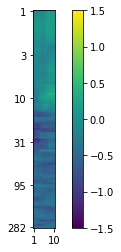

date:180325, rec:004, time:3220.0, label:1.0


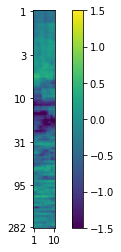

date:180327, rec:007, time:3630.0, label:0.0
date:180324, rec:008, time:4789.0, label:1.0


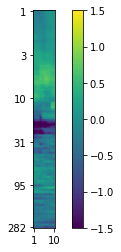

date:180324, rec:008, time:1951.0, label:0.0


In [5]:
# movement labelled 0; non-movement labelled 1
for batch_idx, (data, label, date, rec, time) in enumerate(train_loader):
    for i in range(128):
        print('date:{}, rec:{}, time:{}, label:{}'.format(date[i], rec[i], time[i], label[i][0].numpy()))
        if label[i][0].numpy() == 1.0:
            data_sub = data[i][0]
            plt.yticks(ticks=[0, 20, 40, 60, 80, 99], labels=[round(np.logspace(0, 2.45, 100)[i]) for i in [0, 20, 40, 60, 80, 99]])
            plt.xticks(ticks=[0, 9], labels=[1, 10])
            plt.imshow(data_sub)
            plt.clim(-1.5, 1.5)
            plt.colorbar()
            plt.show()
    break

### Logistic regression with no regularization

In [7]:
learning_rate = 0.001
num_epochs = 51
alpha = 0
model_type = 'LR'
loss_type = 'bce'
reg_type = 'none'

model = GLM().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)

In [5]:
epochs, training_losses, training_acc, val_losses, validation_acc = [], [], [], [], []

for epoch in range(num_epochs):
    train_loss, train_acc = train(model, optimizer, train_loader, alpha=alpha, model_type=model_type, loss_type=loss_type, reg_type=reg_type, collect_result=False, device=device)
    print('Train loss for epoch {}: {}'.format(epoch, train_loss))
    val_loss, val_acc = evaluate(model, optimizer, val_loader, alpha=alpha, model_type=model_type, loss_type=loss_type, reg_type=reg_type, collect_result=False, device=device)
    print('Val loss for epoch {}: {}'.format(epoch, val_loss))
    epochs.append(epoch)
    training_losses.append(train_loss)
    training_acc.append(train_acc)
    val_losses.append(val_loss)
    validation_acc.append(val_acc)
    if val_loss <= min(val_losses):
        best_epoch = epoch
        print(epoch)
        path = '/mnt/pesaranlab/People/Capstone_students/Yue/model/model_Goose_1st_2_upsample'
        torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_EPOCH{}_REDUCEsum.pt'.format(path, model_type, CH, loss_type, reg_type, alpha, epoch))

Train loss for epoch 0: 0.8698410391807556
Val loss for epoch 0: 1.0412458181381226
0
Train loss for epoch 1: 0.38478147983551025
Val loss for epoch 1: 0.775249183177948
1
Train loss for epoch 2: 0.33541128039360046
Val loss for epoch 2: 0.5732774138450623
2
Train loss for epoch 3: 0.345014750957489
Val loss for epoch 3: 0.6570906639099121
Train loss for epoch 4: 0.2689256966114044
Val loss for epoch 4: 1.0822006464004517
Train loss for epoch 5: 0.2802708148956299
Val loss for epoch 5: 1.204707384109497
Train loss for epoch 6: 0.2677329182624817
Val loss for epoch 6: 1.4116936922073364
Train loss for epoch 7: 0.28395894169807434
Val loss for epoch 7: 0.8249962329864502
Train loss for epoch 8: 0.23439064621925354
Val loss for epoch 8: 0.7268000841140747
Train loss for epoch 9: 0.23188826441764832
Val loss for epoch 9: 0.8483158946037292
Train loss for epoch 10: 0.2260662466287613
Val loss for epoch 10: 0.7628230452537537
Train loss for epoch 11: 0.24637679755687714
Val loss for epoch 11

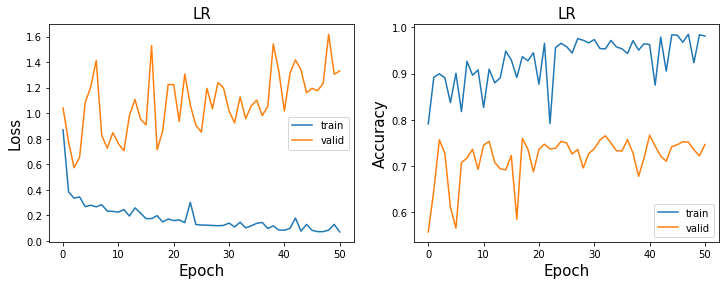

In [6]:
plot_loss_acc(training_losses, val_losses, training_acc, validation_acc, model_type)

test loss:0.5024466514587402, test accuracy:0.829092654824772, test percentage postive:0.7385181784629822


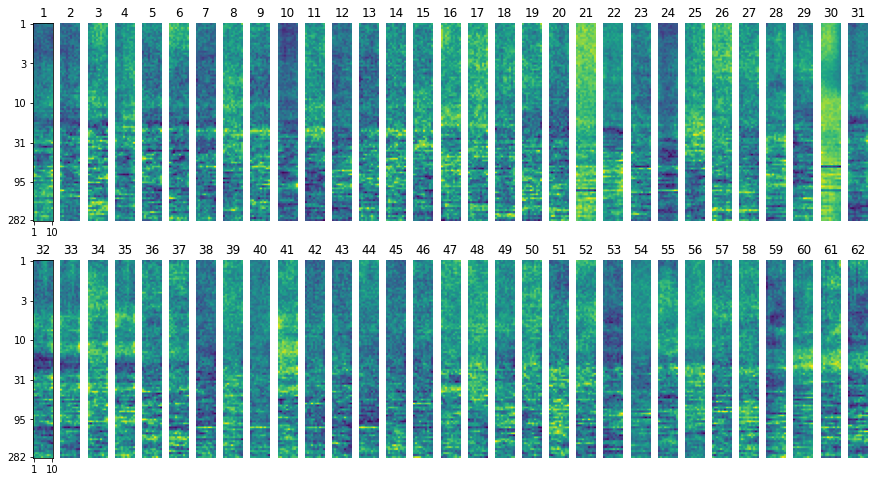

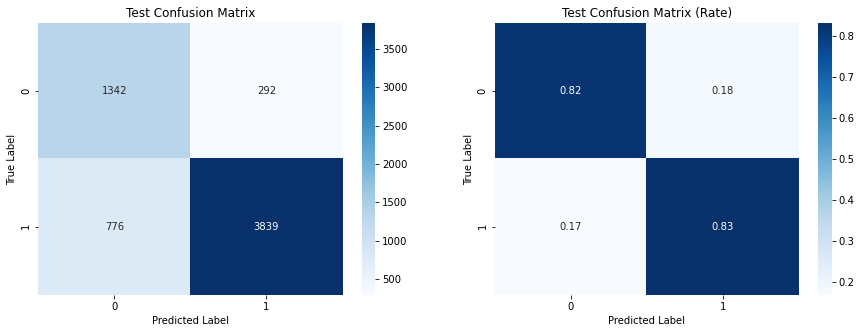

In [9]:
best_epoch = 2
model = GLM().to(device)
model.load_state_dict(torch.load('{}/{}_CH{}_LOSS{}_REG{}{}_EPOCH{}_REDUCEsum.pt'.format(save_path, model_type, CH, loss_type, reg_type, alpha, best_epoch)))

test_loss, test_acc, test_preds, test_preds_probs, test_labels, cases_wrong_0 = evaluate(model, optimizer, test_loader, alpha=alpha, model_type=model_type, loss_type=loss_type, reg_type=reg_type, collect_result=True, device=device)
print('test loss:{}, test accuracy:{}, test percentage postive:{}'.format(test_loss, test_acc, np.mean(np.concatenate(test_labels))))
plot_weight_glm(device, save_path, model_type, CH, loss_type, reg_type, alpha, best_epoch)
plot_confusion(test_preds, test_labels)

### Logistic regression with L2 regularization

In [10]:
learning_rate = 0.001
num_epochs = 51
alpha = 0.1
model_type = 'LR'
loss_type = 'bce'
reg_type = 'l2'

model = GLM().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)

0
Train loss for epoch 0: 0.7115544676780701
Val loss for epoch 0: 0.7432355880737305
2
Train loss for epoch 2: 0.34764564037323
Val loss for epoch 2: 0.6018259525299072


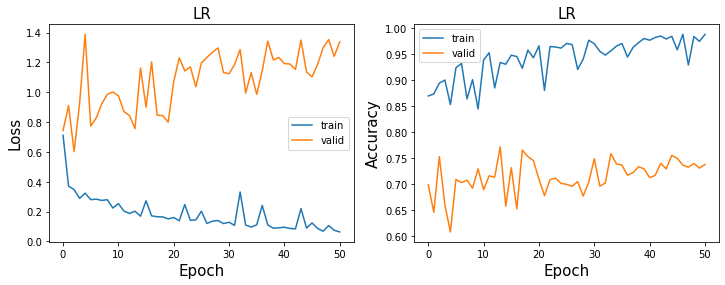

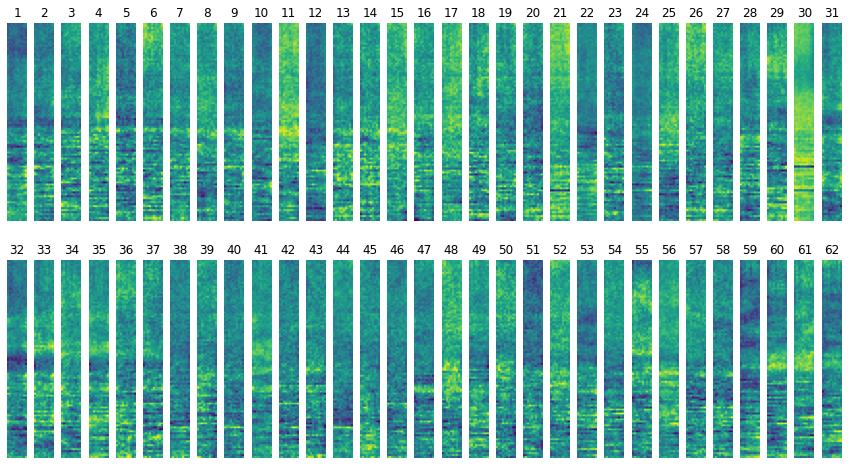

0
Train loss for epoch 0: 0.10478340834379196
Val loss for epoch 0: 1.4120193719863892
1
Train loss for epoch 1: 0.10633908212184906
Val loss for epoch 1: 1.3098647594451904
4
Train loss for epoch 4: 0.17120695114135742
Val loss for epoch 4: 1.273625373840332
7
Train loss for epoch 7: 0.10516157746315002
Val loss for epoch 7: 1.2127503156661987
10
Train loss for epoch 10: 0.09725989401340485
Val loss for epoch 10: 1.1993366479873657


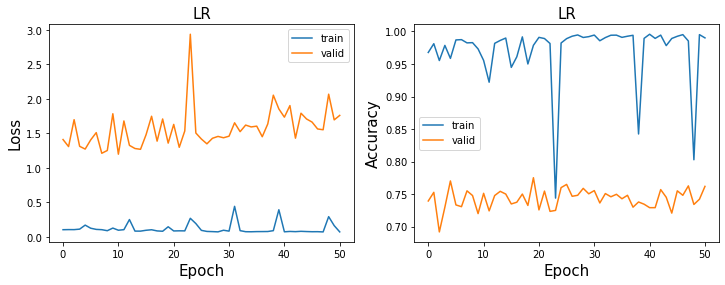

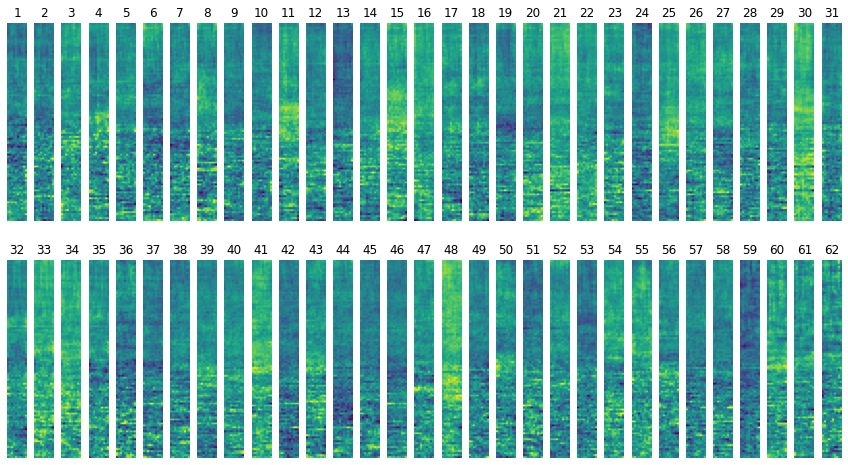

0
Train loss for epoch 0: 0.43223586678504944
Val loss for epoch 0: 1.904915452003479
1
Train loss for epoch 1: 0.41662847995758057
Val loss for epoch 1: 1.7956180572509766
3
Train loss for epoch 3: 0.39772137999534607
Val loss for epoch 3: 1.5438883304595947
4
Train loss for epoch 4: 0.531205415725708
Val loss for epoch 4: 1.4690940380096436
5
Train loss for epoch 5: 0.38504552841186523
Val loss for epoch 5: 1.4486452341079712
8
Train loss for epoch 8: 0.36621689796447754
Val loss for epoch 8: 1.4351238012313843
9
Train loss for epoch 9: 0.39422839879989624
Val loss for epoch 9: 1.2041958570480347
11
Train loss for epoch 11: 0.3845957815647125
Val loss for epoch 11: 1.1681476831436157
13
Train loss for epoch 13: 0.3634333312511444
Val loss for epoch 13: 1.0549226999282837
15
Train loss for epoch 15: 0.3336891531944275
Val loss for epoch 15: 1.0329638719558716
16
Train loss for epoch 16: 0.32055720686912537
Val loss for epoch 16: 0.9844588041305542
17
Train loss for epoch 17: 0.3588395

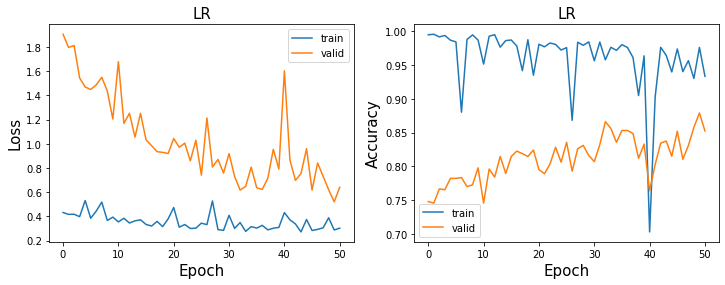

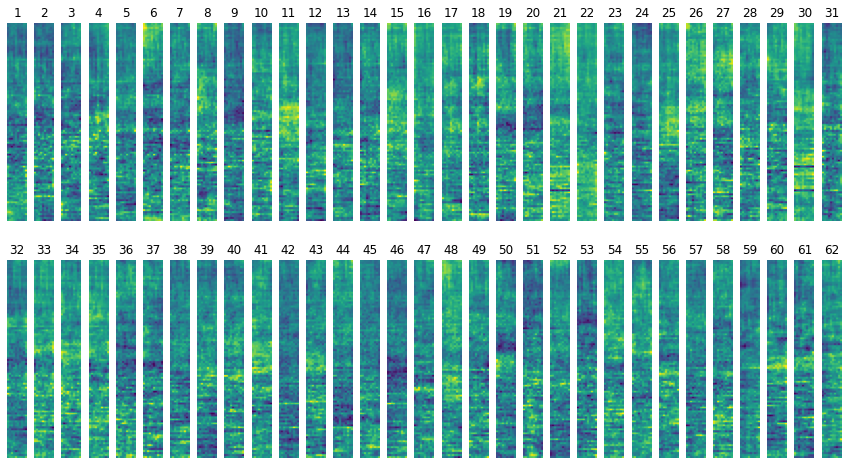

0
Train loss for epoch 0: 0.9041321277618408
Val loss for epoch 0: 1.0868315696716309
1
Train loss for epoch 1: 0.8335866332054138
Val loss for epoch 1: 0.8628571629524231
2
Train loss for epoch 2: 0.7024531960487366
Val loss for epoch 2: 0.7168710231781006
3
Train loss for epoch 3: 0.6396141648292542
Val loss for epoch 3: 0.588773250579834
4
Train loss for epoch 4: 0.583483099937439
Val loss for epoch 4: 0.4313656985759735
7
Train loss for epoch 7: 0.549942672252655
Val loss for epoch 7: 0.35383090376853943
10
Train loss for epoch 10: 0.5141057968139648
Val loss for epoch 10: 0.3366197943687439
41
Train loss for epoch 41: 0.48544448614120483
Val loss for epoch 41: 0.33548468351364136


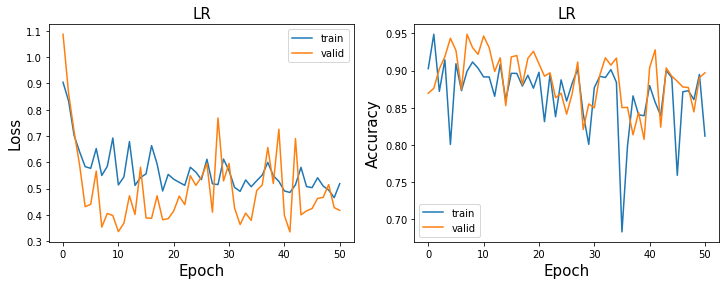

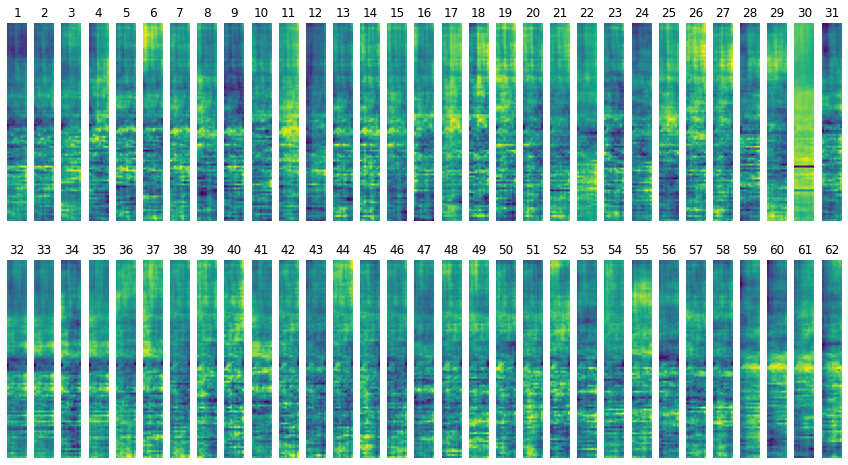

0
Train loss for epoch 0: 0.6965368986129761
Val loss for epoch 0: 0.47390979528427124
3
Train loss for epoch 3: 0.5434879064559937
Val loss for epoch 3: 0.32826417684555054


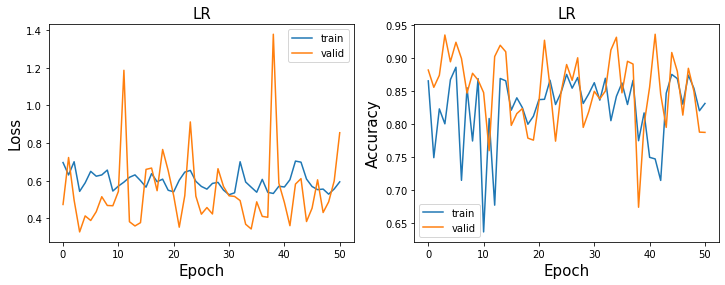

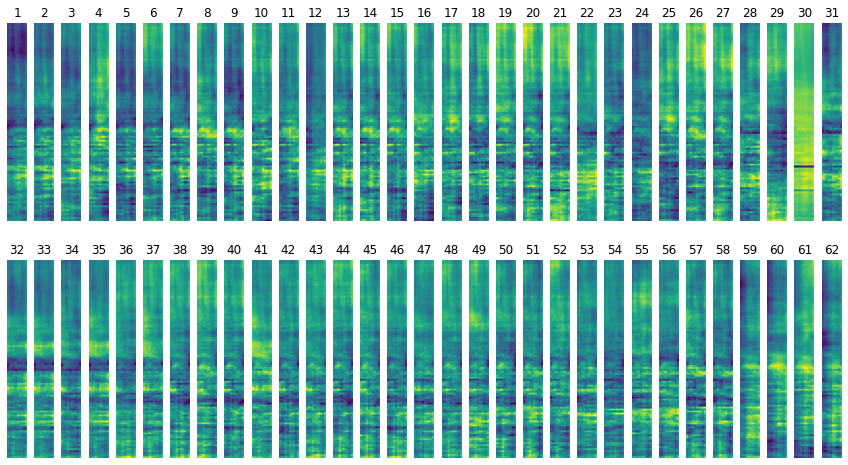

In [5]:
for alpha in [0.1, 1, 10, 50, 100]:
    tuning(train_loader, val_loader, model, optimizer, device, num_epochs, alpha, model_type, loss_type, reg_type, CH, save_path)

test loss:0.59657222032547, test accuracy:0.771483437349976, test percentage postive:0.7385181784629822


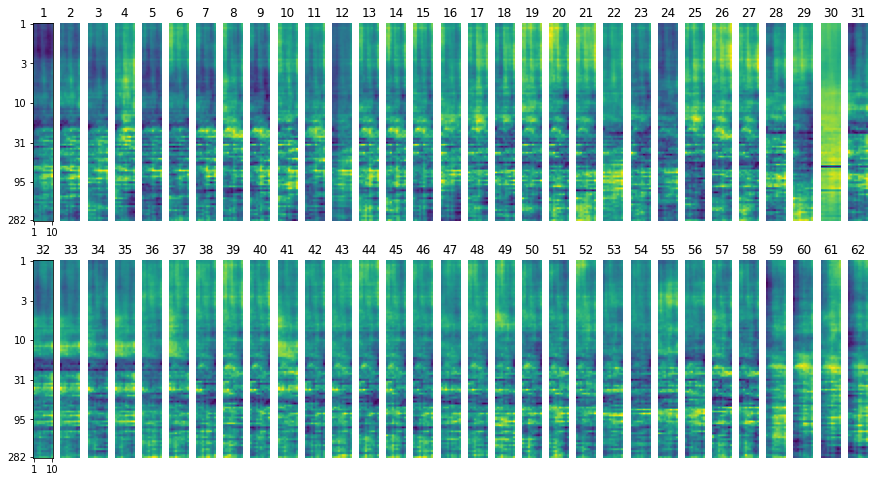

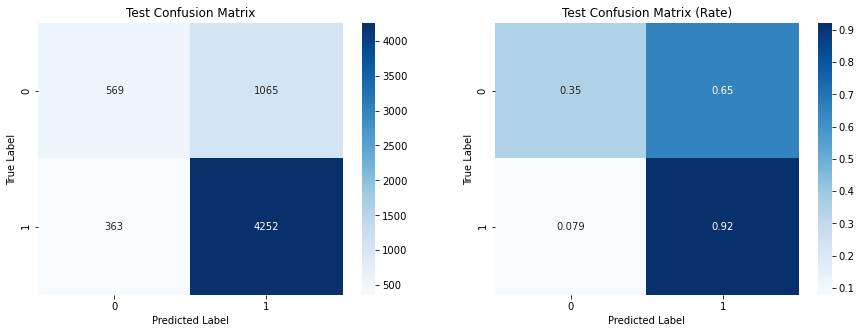

In [11]:
best_epoch = 3
alpha = 100
model = GLM().to(device)
model.load_state_dict(torch.load('{}/{}_CH{}_LOSS{}_REG{}{}_EPOCH{}_REDUCEsum.pt'.format(save_path, model_type, CH, loss_type, reg_type, alpha, best_epoch)))

test_loss, test_acc, test_preds, test_preds_probs, test_labels, cases_wrong_1 = evaluate(model, optimizer, test_loader, alpha=alpha, model_type=model_type, loss_type=loss_type, reg_type=reg_type, collect_result=True, device=device)
print('test loss:{}, test accuracy:{}, test percentage postive:{}'.format(test_loss, test_acc, np.mean(np.concatenate(test_labels))))
plot_weight_glm(device, save_path, model_type, CH, loss_type, reg_type, alpha, best_epoch)
plot_confusion(test_preds, test_labels)

### Logistic Regression with finite difference regularization

In [12]:
learning_rate = 0.001
num_epochs = 51
alpha = 50
model_type = 'LR'
loss_type = 'bce'
reg_type = 'finite_diff'

model = GLM().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)

In [17]:
epochs, training_losses, training_acc, val_losses, validation_acc = [], [], [], [], []

for epoch in range(num_epochs):
    train_loss, train_acc = train(model, optimizer, train_loader, alpha=alpha, model_type=model_type, loss_type=loss_type, reg_type=reg_type, collect_result=False, device=device)
    print('Train loss for epoch {}: {}'.format(epoch, train_loss))
    val_loss, val_acc = evaluate(model, optimizer, val_loader, alpha=alpha, model_type=model_type, loss_type=loss_type, reg_type=reg_type, collect_result=False, device=device)
    print('Val loss for epoch {}: {}'.format(epoch, val_loss))
    epochs.append(epoch)
    training_losses.append(train_loss)
    training_acc.append(train_acc)
    val_losses.append(val_loss)
    validation_acc.append(val_acc)
    if val_loss <= min(val_losses):
        best_epoch = epoch
        print(epoch)
        path = '/mnt/pesaranlab/People/Capstone_students/Yue/model/model_Goose_1st_2_upsample'
        torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_EPOCH{}_REDUCEsum.pt'.format(path, model_type, CH, loss_type, reg_type, alpha, epoch))

Train loss for epoch 0: 1.6299024820327759
Val loss for epoch 0: 0.6085063815116882
0
Train loss for epoch 1: 0.4836345613002777
Val loss for epoch 1: 0.6976475119590759
Train loss for epoch 2: 0.46084046363830566
Val loss for epoch 2: 0.9535163640975952
Train loss for epoch 3: 0.4850994050502777
Val loss for epoch 3: 0.8800923228263855
Train loss for epoch 4: 0.41160255670547485
Val loss for epoch 4: 0.5359351634979248
4
Train loss for epoch 5: 0.49901172518730164
Val loss for epoch 5: 0.839212954044342
Train loss for epoch 6: 0.46442919969558716
Val loss for epoch 6: 0.5960174202919006
Train loss for epoch 7: 0.46933475136756897
Val loss for epoch 7: 0.9904953241348267
Train loss for epoch 8: 0.4015135169029236
Val loss for epoch 8: 0.7753666043281555
Train loss for epoch 9: 0.4179345369338989
Val loss for epoch 9: 0.906818151473999
Train loss for epoch 10: 0.43043753504753113
Val loss for epoch 10: 0.9109571576118469
Train loss for epoch 11: 0.4403202533721924
Val loss for epoch 11:

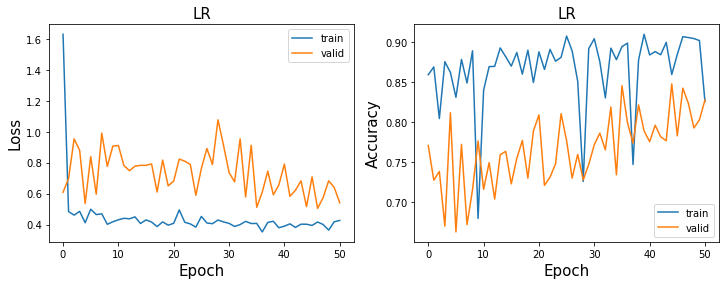

In [18]:
plot_loss_acc(training_losses, val_losses, training_acc, validation_acc, model_type) # alpha=50

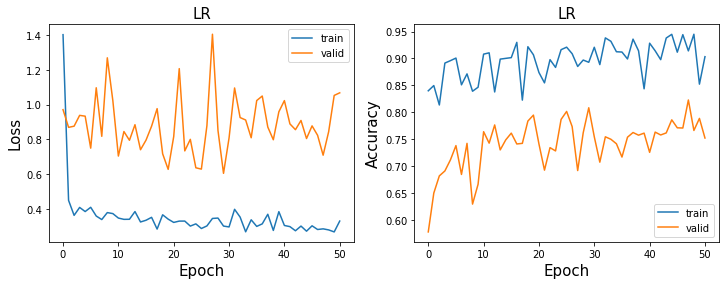

In [14]:
plot_loss_acc(training_losses, val_losses, training_acc, validation_acc, model_type) # alpha=10

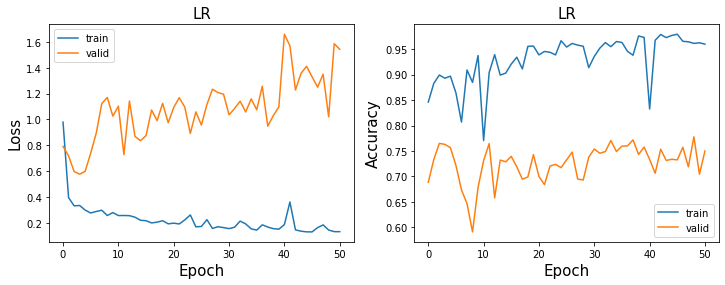

In [9]:
plot_loss_acc(training_losses, val_losses, training_acc, validation_acc, model_type) # alpha=1

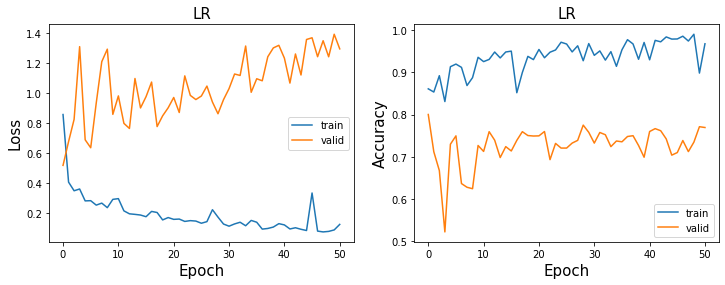

In [15]:
plot_loss_acc(training_losses, val_losses, training_acc, validation_acc, model_type) # alpha=0.1

test loss:0.5500415563583374, test accuracy:0.8442950872139542, test percentage postive:0.7385181784629822


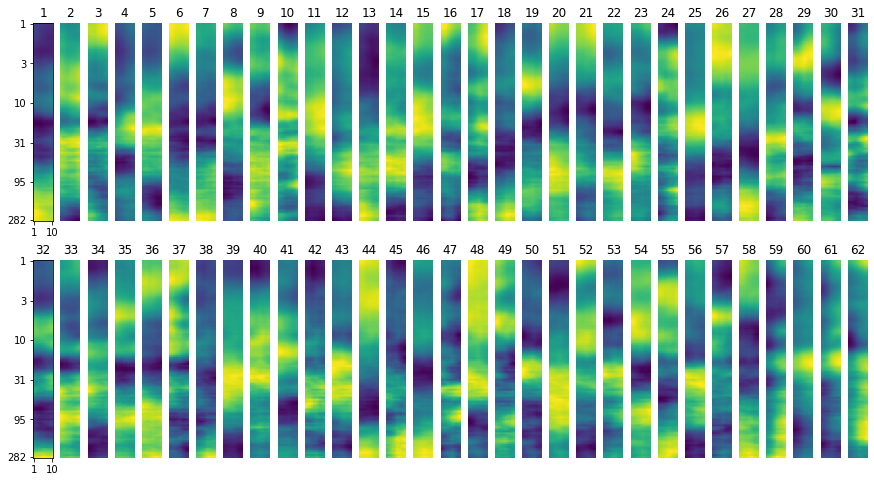

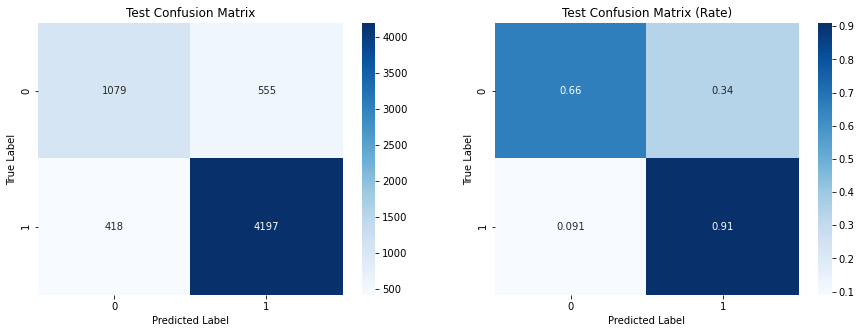

In [16]:
best_epoch = 46
alpha = 50
model = GLM().to(device)
model.load_state_dict(torch.load('{}/{}_CH{}_LOSS{}_REG{}{}_EPOCH{}_REDUCEsum.pt'.format(save_path, model_type, CH, loss_type, reg_type, alpha, best_epoch)))

test_loss, test_acc, test_preds, test_preds_probs, test_labels, cases_wrong_2 = evaluate(model, optimizer, test_loader, alpha=alpha, model_type=model_type, loss_type=loss_type, reg_type=reg_type, collect_result=True, device=device)
print('test loss:{}, test accuracy:{}, test percentage postive:{}'.format(test_loss, test_acc, np.mean(np.concatenate(test_labels))))
plot_weight_glm(device, save_path, model_type, CH, loss_type, reg_type, alpha, best_epoch)
plot_confusion(test_preds, test_labels)

### SVM without regularization

In [20]:
learning_rate = 0.001
num_epochs = 51
alpha = 0 
model_type = 'SVM'
loss_type = 'hinge'
reg_type = 'none'

model = GLM().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)

In [34]:
epochs, training_losses, training_acc, val_losses, validation_acc = [], [], [], [], []

for epoch in range(num_epochs):
    train_loss, train_acc = train(model, optimizer, train_loader, alpha=alpha, model_type=model_type, loss_type=loss_type, reg_type=reg_type, collect_result=False, device=device)
    print('Train loss for epoch {}: {}'.format(epoch, train_loss))
    val_loss, val_acc = evaluate(model, optimizer, val_loader, alpha=alpha, model_type=model_type, loss_type=loss_type, reg_type=reg_type, collect_result=False, device=device)
    print('Val loss for epoch {}: {}'.format(epoch, val_loss))
    epochs.append(epoch)
    training_losses.append(train_loss)
    training_acc.append(train_acc)
    val_losses.append(val_loss)
    validation_acc.append(val_acc)
    if val_loss <= min(val_losses):
        best_epoch = epoch
        print(epoch)
        path = '/mnt/pesaranlab/People/Capstone_students/Yue/model/model_Goose_1st_2_upsample'
        torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_EPOCH{}_REDUCEsum.pt'.format(path, model_type, CH, loss_type, reg_type, alpha, epoch))

Train loss for epoch 0: 0.9479582905769348
Val loss for epoch 0: 1.161095380783081
0
Train loss for epoch 1: 0.46145084500312805
Val loss for epoch 1: 1.2020856142044067
Train loss for epoch 2: 0.4774002730846405
Val loss for epoch 2: 1.4720901250839233
Train loss for epoch 3: 0.35471025109291077
Val loss for epoch 3: 0.7256836295127869
3
Train loss for epoch 4: 0.35083824396133423
Val loss for epoch 4: 1.0116678476333618
Train loss for epoch 5: 0.3499155044555664
Val loss for epoch 5: 1.242923378944397
Train loss for epoch 6: 0.35000598430633545
Val loss for epoch 6: 1.1334004402160645
Train loss for epoch 7: 0.3459993898868561
Val loss for epoch 7: 1.7314574718475342
Train loss for epoch 8: 0.278999924659729
Val loss for epoch 8: 0.899244487285614
Train loss for epoch 9: 0.3231593072414398
Val loss for epoch 9: 1.1321349143981934
Train loss for epoch 10: 0.23296405375003815
Val loss for epoch 10: 1.0607959032058716
Train loss for epoch 11: 0.2517755925655365
Val loss for epoch 11: 1.

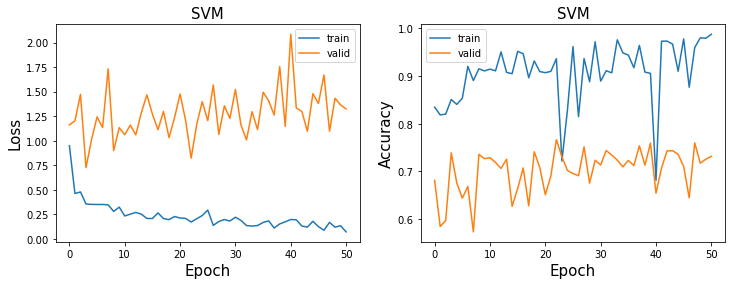

In [35]:
plot_loss_acc(training_losses, val_losses, training_acc, validation_acc, model_type)

test loss:0.699118435382843, test accuracy:0.8114898383741399, test percentage postive:0.7385181784629822


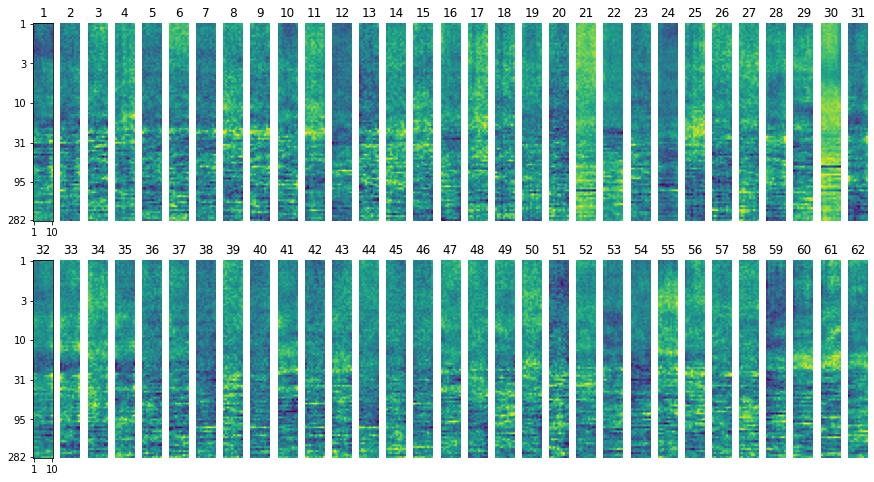

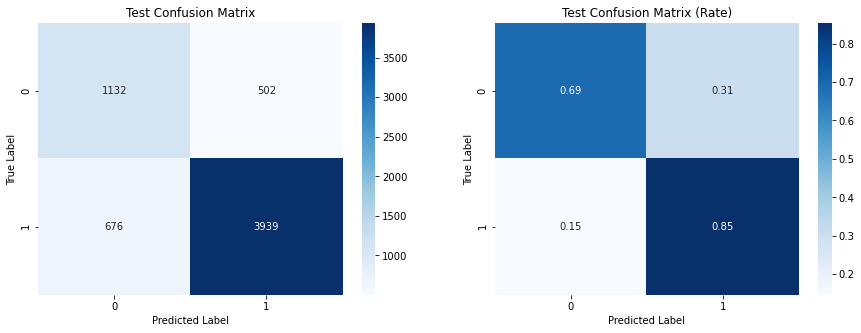

In [19]:
best_epoch = 3
model = GLM().to(device)
model.load_state_dict(torch.load('{}/{}_CH{}_LOSS{}_REG{}{}_EPOCH{}_REDUCEsum.pt'.format(save_path, model_type, CH, loss_type, reg_type, alpha, best_epoch)))

test_loss, test_acc, test_preds, test_preds_probs, test_labels, cases_wrong_3 = evaluate(model, optimizer, test_loader, alpha=alpha, model_type=model_type, loss_type=loss_type, reg_type=reg_type, collect_result=True, device=device)
print('test loss:{}, test accuracy:{}, test percentage postive:{}'.format(test_loss, test_acc, np.mean(np.concatenate(test_labels))))
plot_weight_glm(device, save_path, model_type, CH, loss_type, reg_type, alpha, best_epoch)
plot_confusion(test_preds, test_labels)

### SVM with L2 regularization

In [21]:
learning_rate = 0.001
num_epochs = 51
alpha = 0.1
model_type = 'SVM'
loss_type = 'hinge'
reg_type = 'l2'

model = GLM().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)

0
Train loss for epoch 0: 0.9710332155227661
Val loss for epoch 0: 0.9690608382225037
2
Train loss for epoch 2: 0.4357890188694
Val loss for epoch 2: 0.7301080822944641


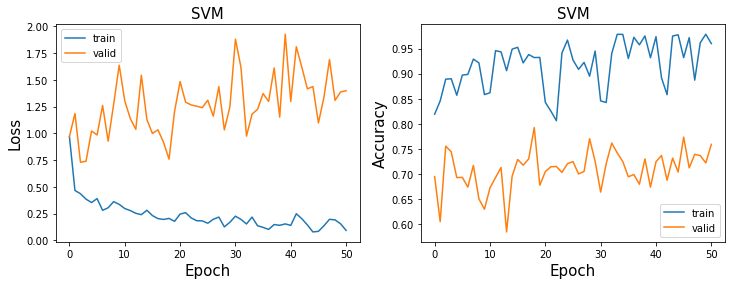

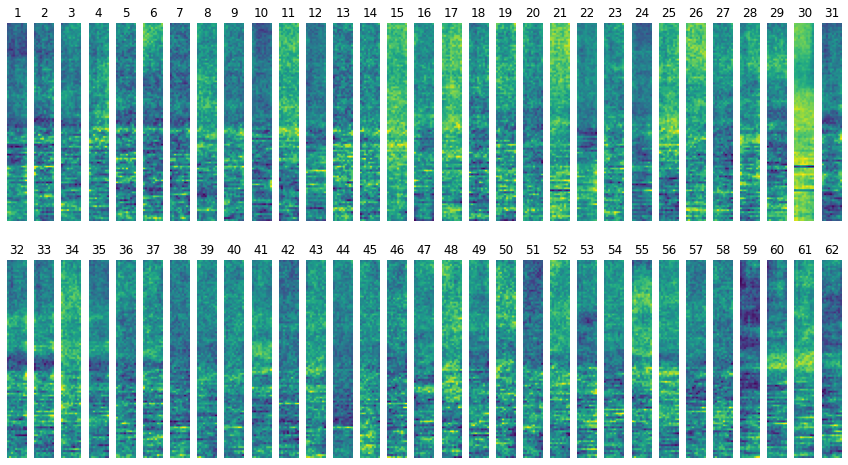

0
Train loss for epoch 0: 0.1257954090833664
Val loss for epoch 0: 1.416718602180481
4
Train loss for epoch 4: 0.15846645832061768
Val loss for epoch 4: 1.3146992921829224
7
Train loss for epoch 7: 0.1110614761710167
Val loss for epoch 7: 1.246881127357483


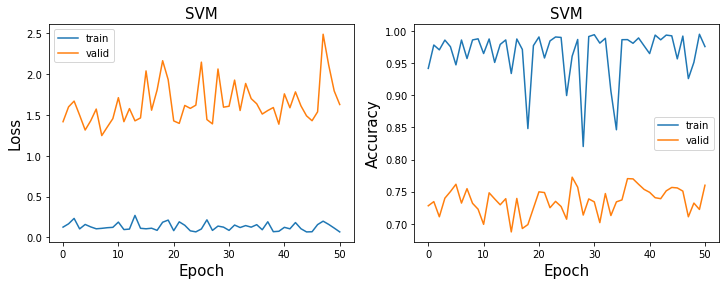

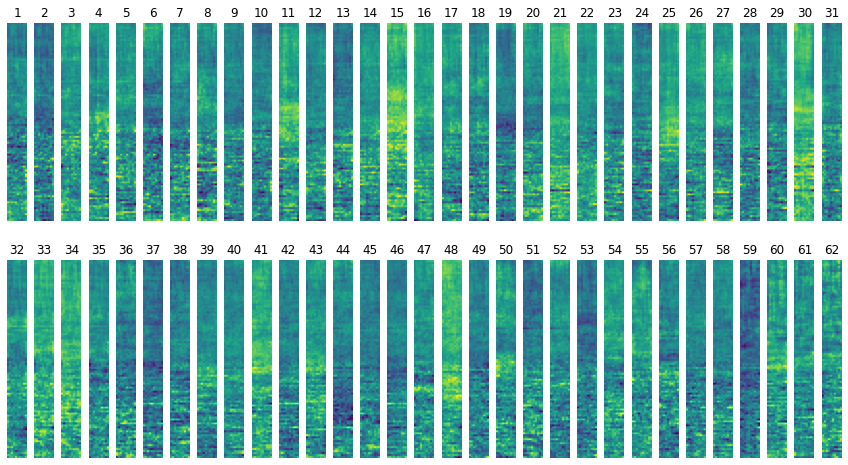

0
Train loss for epoch 0: 0.4020991921424866
Val loss for epoch 0: 2.315312385559082
1
Train loss for epoch 1: 0.43415606021881104
Val loss for epoch 1: 1.8700617551803589
3
Train loss for epoch 3: 0.3745730519294739
Val loss for epoch 3: 1.839136004447937
4
Train loss for epoch 4: 0.3791460692882538
Val loss for epoch 4: 1.6710301637649536
7
Train loss for epoch 7: 0.4177365005016327
Val loss for epoch 7: 1.6686676740646362
10
Train loss for epoch 10: 0.46689483523368835
Val loss for epoch 10: 1.5502513647079468
15
Train loss for epoch 15: 0.3617737293243408
Val loss for epoch 15: 1.3347102403640747
19
Train loss for epoch 19: 0.34879183769226074
Val loss for epoch 19: 1.330902338027954
21
Train loss for epoch 21: 0.31197693943977356
Val loss for epoch 21: 1.2428523302078247
22
Train loss for epoch 22: 0.393091082572937
Val loss for epoch 22: 1.2243294715881348
26
Train loss for epoch 26: 0.5222835540771484
Val loss for epoch 26: 1.2027467489242554
27
Train loss for epoch 27: 0.399201

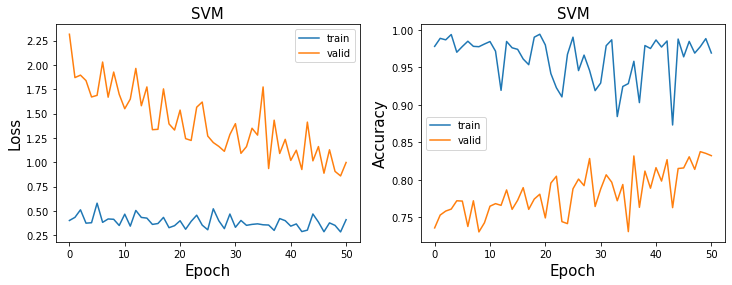

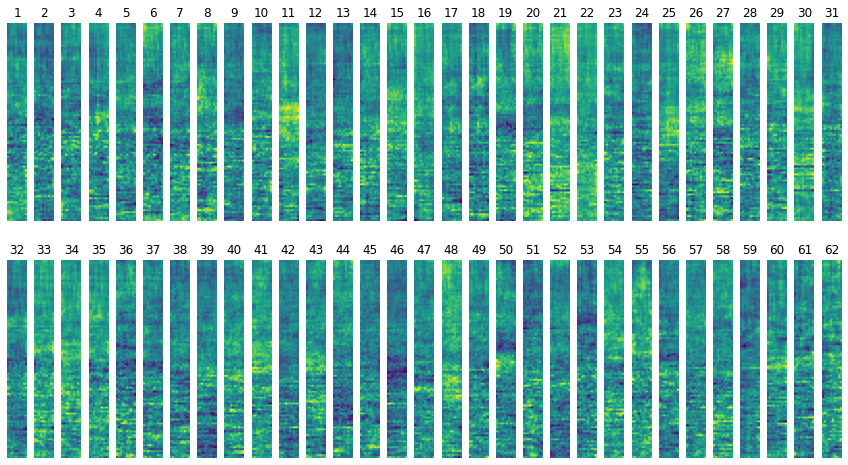

0
Train loss for epoch 0: 1.1004397869110107
Val loss for epoch 0: 1.6155104637145996
1
Train loss for epoch 1: 1.1085482835769653
Val loss for epoch 1: 1.5875823497772217
2
Train loss for epoch 2: 0.9583359360694885
Val loss for epoch 2: 1.158643126487732
3
Train loss for epoch 3: 0.925772488117218
Val loss for epoch 3: 1.111171841621399
6
Train loss for epoch 6: 0.7448486089706421
Val loss for epoch 6: 0.8041178584098816
8
Train loss for epoch 8: 0.6842674612998962
Val loss for epoch 8: 0.6082392930984497
9
Train loss for epoch 9: 0.6616500020027161
Val loss for epoch 9: 0.5394949913024902
15
Train loss for epoch 15: 0.6590972542762756
Val loss for epoch 15: 0.5137646198272705
16
Train loss for epoch 16: 0.593135416507721
Val loss for epoch 16: 0.41175776720046997
30
Train loss for epoch 30: 0.6125960350036621
Val loss for epoch 30: 0.3794732689857483
31
Train loss for epoch 31: 0.5769630670547485
Val loss for epoch 31: 0.3587077856063843
50
Train loss for epoch 50: 0.524743080139160

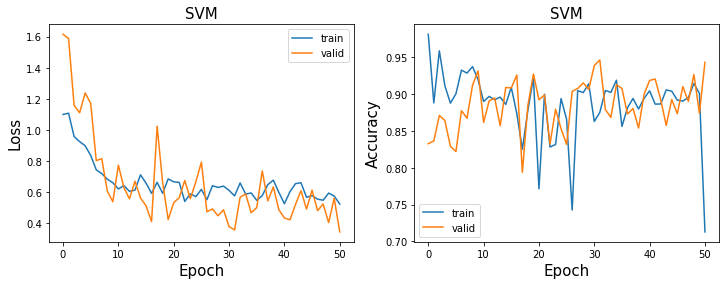

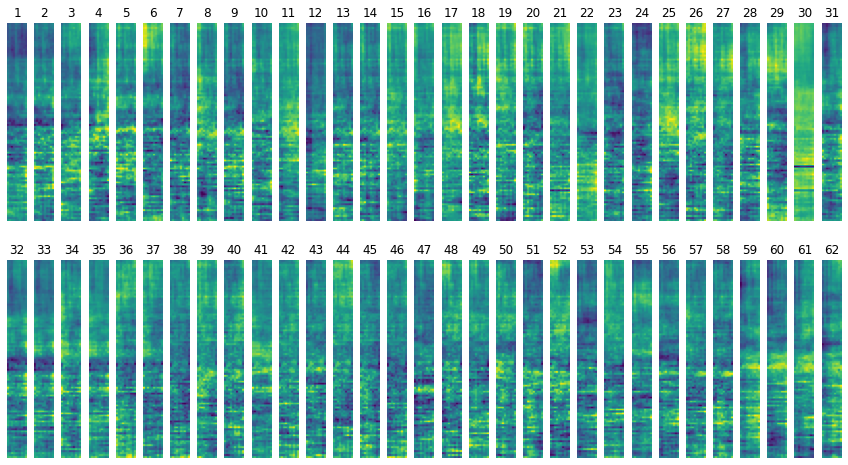

0
Train loss for epoch 0: 0.7482563257217407
Val loss for epoch 0: 0.6743438839912415
2
Train loss for epoch 2: 0.7094283103942871
Val loss for epoch 2: 0.37215369939804077
3
Train loss for epoch 3: 0.7567992210388184
Val loss for epoch 3: 0.3643988370895386
18
Train loss for epoch 18: 0.7376281023025513
Val loss for epoch 18: 0.34577396512031555
34
Train loss for epoch 34: 0.7254757881164551
Val loss for epoch 34: 0.3437761664390564


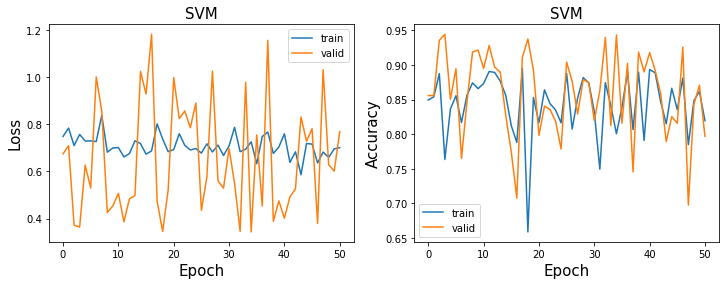

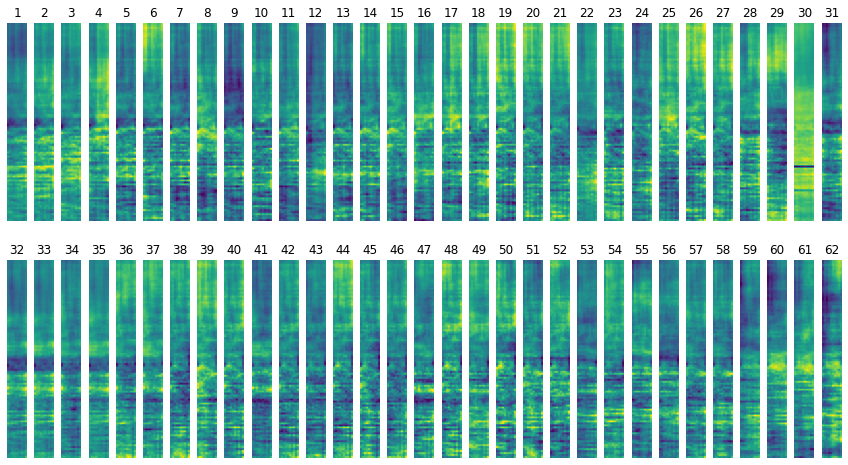

In [7]:
for alpha in [0.1, 1, 10, 50, 100]:
    tuning(train_loader, val_loader, model, optimizer, device, num_epochs, alpha, model_type, loss_type, reg_type, CH, save_path)

test loss:0.7126793265342712, test accuracy:0.7954872779644743, test percentage postive:0.7385181784629822


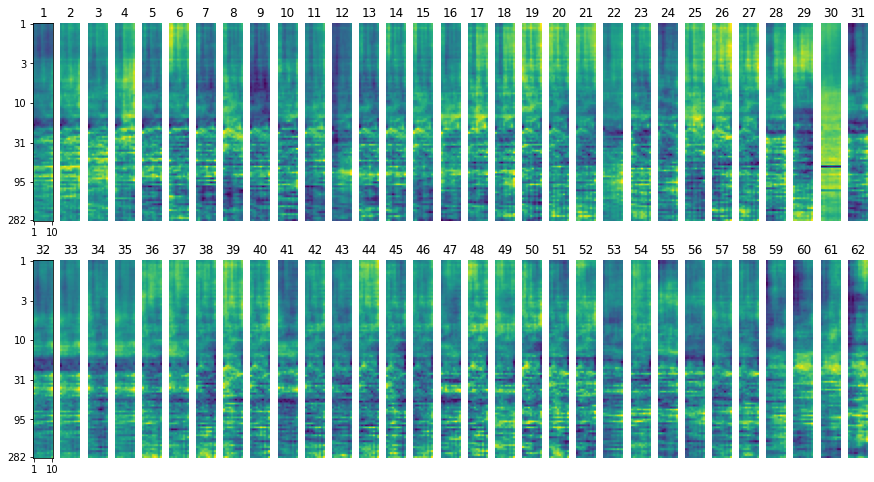

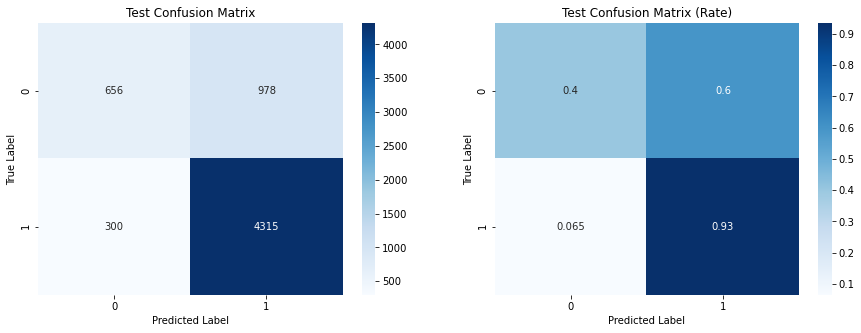

In [25]:
best_epoch = 34
alpha = 100
model = GLM().to(device)
model.load_state_dict(torch.load('{}/{}_CH{}_LOSS{}_REG{}{}_EPOCH{}_REDUCEsum.pt'.format(save_path, model_type, CH, loss_type, reg_type, alpha, best_epoch)))

test_loss, test_acc, test_preds, test_preds_probs, test_labels, cases_wrong_4 = evaluate(model, optimizer, test_loader, alpha=alpha, model_type=model_type, loss_type=loss_type, reg_type=reg_type, collect_result=True, device=device)
print('test loss:{}, test accuracy:{}, test percentage postive:{}'.format(test_loss, test_acc, np.mean(np.concatenate(test_labels))))
plot_weight_glm(device, save_path, model_type, CH, loss_type, reg_type, alpha, best_epoch)
plot_confusion(test_preds, test_labels)

### SVM with finite difference regularization

In [26]:
learning_rate = 0.001
num_epochs = 51
alpha = 0.1
model_type = 'SVM'
loss_type = 'hinge'
reg_type = 'finite_diff'

model = GLM().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)

0
Train loss for epoch 0: 0.8310920596122742
Val loss for epoch 0: 0.9774964451789856
1
Train loss for epoch 1: 0.4324101507663727
Val loss for epoch 1: 0.8406139612197876
5
Train loss for epoch 5: 0.31109505891799927
Val loss for epoch 5: 0.7477527856826782


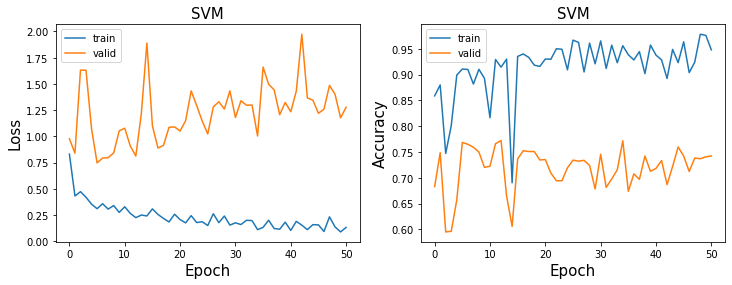

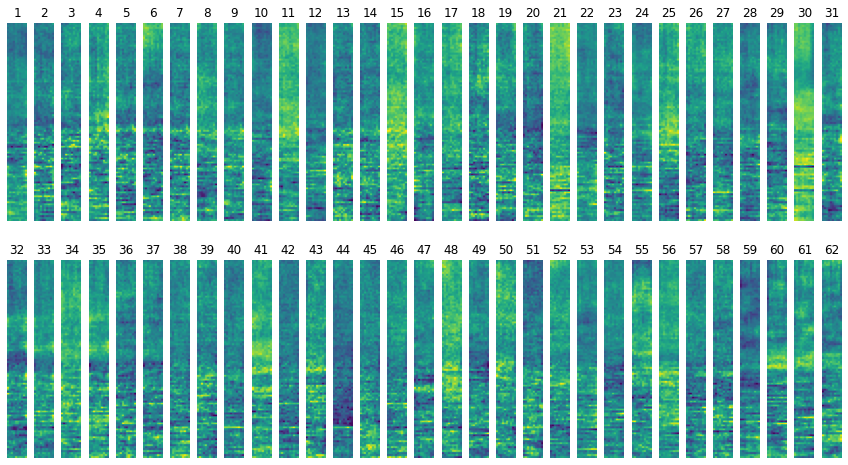

0
Train loss for epoch 0: 0.15757371485233307
Val loss for epoch 0: 1.2912808656692505


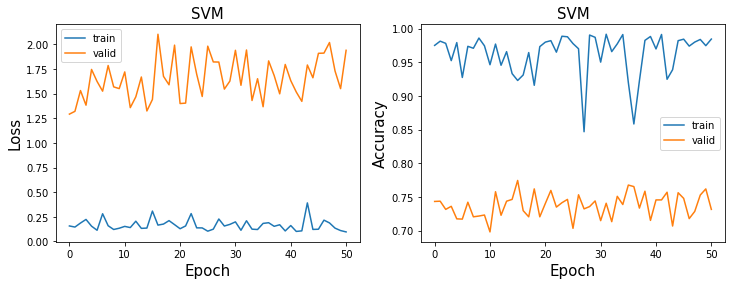

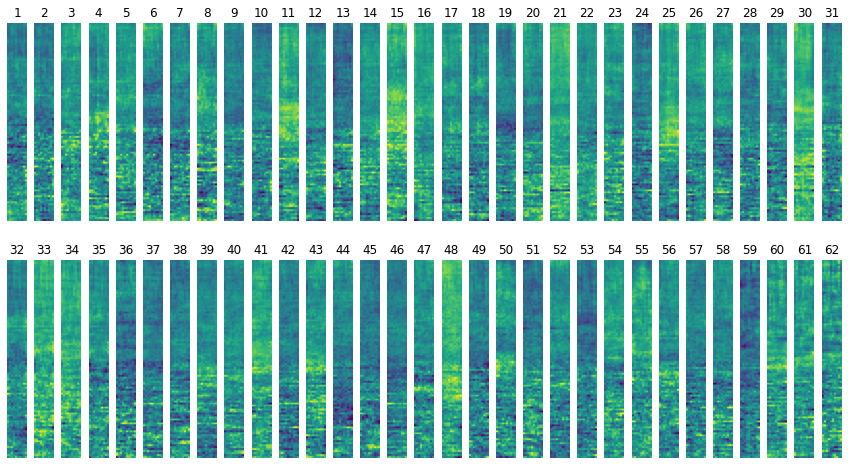

0
Train loss for epoch 0: 0.6793347597122192
Val loss for epoch 0: 2.8206892013549805
1
Train loss for epoch 1: 0.6089456677436829
Val loss for epoch 1: 2.2737584114074707
4
Train loss for epoch 4: 0.5355126857757568
Val loss for epoch 4: 1.7922489643096924
6
Train loss for epoch 6: 0.4317236840724945
Val loss for epoch 6: 1.6547170877456665
9
Train loss for epoch 9: 0.5170100331306458
Val loss for epoch 9: 1.5194801092147827
10
Train loss for epoch 10: 0.4591292440891266
Val loss for epoch 10: 1.471250057220459
19
Train loss for epoch 19: 0.3734774887561798
Val loss for epoch 19: 1.4580687284469604
20
Train loss for epoch 20: 0.37761834263801575
Val loss for epoch 20: 1.2123832702636719
34
Train loss for epoch 34: 0.37430351972579956
Val loss for epoch 34: 1.122431993484497
39
Train loss for epoch 39: 0.3988632261753082
Val loss for epoch 39: 1.0508416891098022


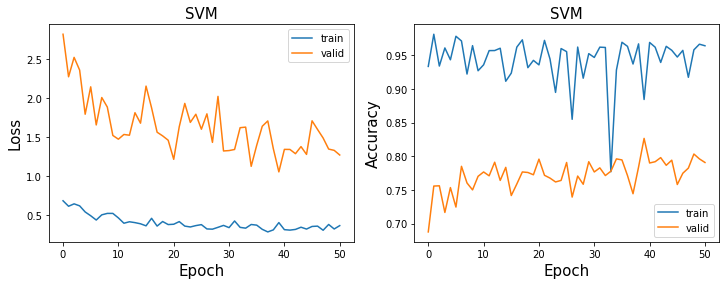

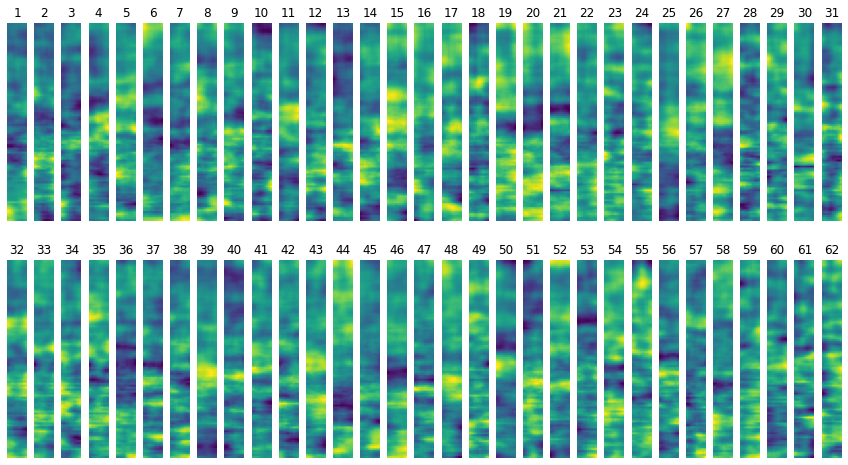

0
Train loss for epoch 0: 0.7724424600601196
Val loss for epoch 0: 2.0250155925750732
1
Train loss for epoch 1: 0.7021592259407043
Val loss for epoch 1: 1.528692603111267
2
Train loss for epoch 2: 0.5920543670654297
Val loss for epoch 2: 1.5230151414871216
4
Train loss for epoch 4: 0.6345184445381165
Val loss for epoch 4: 1.2713414430618286
7
Train loss for epoch 7: 0.5153455138206482
Val loss for epoch 7: 1.2016738653182983
9
Train loss for epoch 9: 0.5423747897148132
Val loss for epoch 9: 1.1366913318634033
11
Train loss for epoch 11: 0.5681702494621277
Val loss for epoch 11: 1.0989148616790771
14
Train loss for epoch 14: 0.4933352768421173
Val loss for epoch 14: 1.0042037963867188
21
Train loss for epoch 21: 0.475496381521225
Val loss for epoch 21: 0.978232204914093
22
Train loss for epoch 22: 0.48478811979293823
Val loss for epoch 22: 0.9587408900260925
25
Train loss for epoch 25: 0.5231640934944153
Val loss for epoch 25: 0.9474488496780396
34
Train loss for epoch 34: 0.50680196285

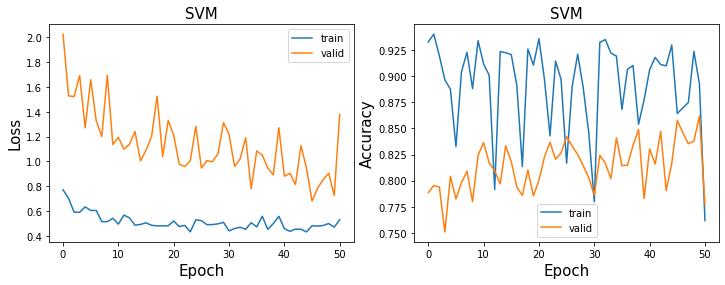

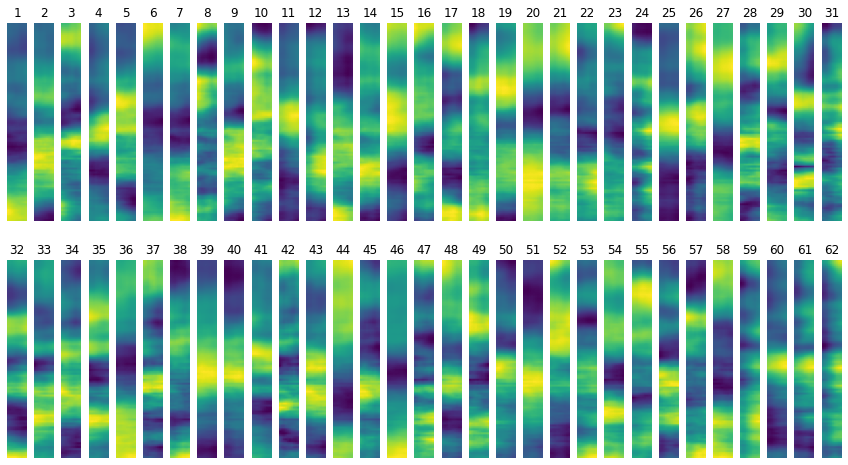

0
Train loss for epoch 0: 0.5686618685722351
Val loss for epoch 0: 0.9809105396270752
2
Train loss for epoch 2: 0.6156154870986938
Val loss for epoch 2: 0.8527547121047974
7
Train loss for epoch 7: 0.5070004463195801
Val loss for epoch 7: 0.827976644039154
10
Train loss for epoch 10: 0.5575091242790222
Val loss for epoch 10: 0.7263656258583069
13
Train loss for epoch 13: 0.5269984006881714
Val loss for epoch 13: 0.5313417911529541


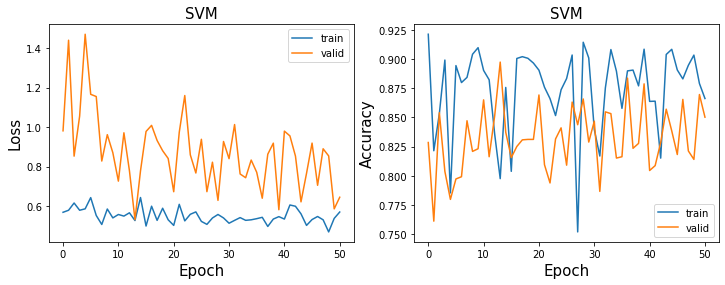

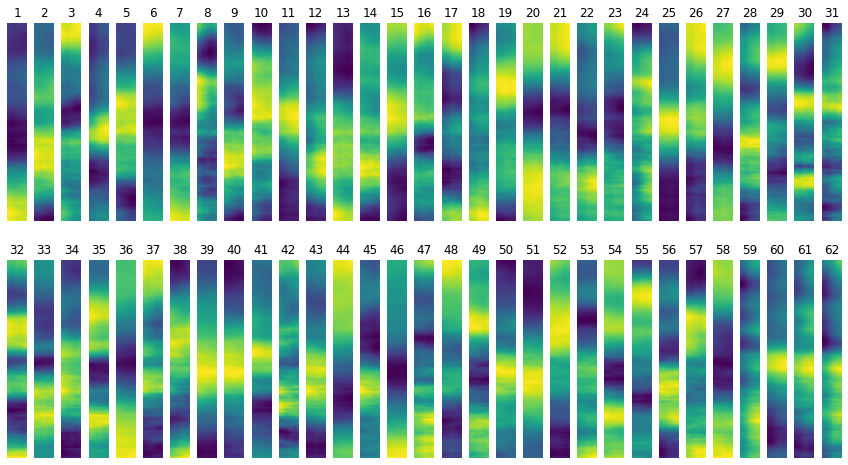

In [9]:
for alpha in [0.1, 1, 10, 50, 100]:
    tuning(train_loader, val_loader, model, optimizer, device, num_epochs, alpha, model_type, loss_type, reg_type, CH, save_path)

test loss:1.0844372510910034, test accuracy:0.7886061769883181, test percentage postive:0.7385181784629822


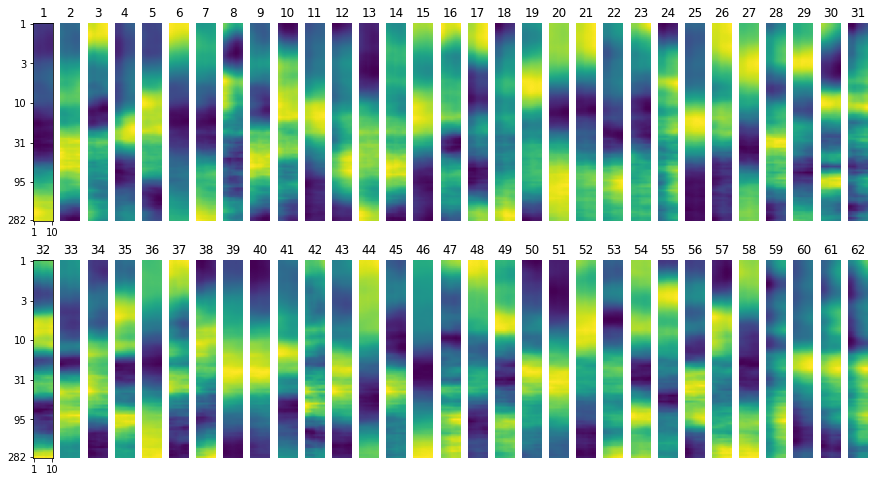

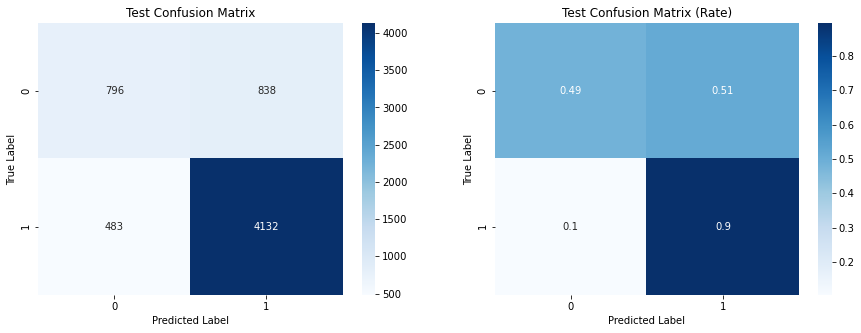

In [27]:
best_epoch = 13
alpha = 100
model = GLM().to(device)
model.load_state_dict(torch.load('{}/{}_CH{}_LOSS{}_REG{}{}_EPOCH{}_REDUCEsum.pt'.format(save_path, model_type, CH, loss_type, reg_type, alpha, best_epoch)))

test_loss, test_acc, test_preds, test_preds_probs, test_labels, cases_wrong_5 = evaluate(model, optimizer, test_loader, alpha=alpha, model_type=model_type, loss_type=loss_type, reg_type=reg_type, collect_result=True, device=device)
print('test loss:{}, test accuracy:{}, test percentage postive:{}'.format(test_loss, test_acc, np.mean(np.concatenate(test_labels))))
plot_weight_glm(device, save_path, model_type, CH, loss_type, reg_type, alpha, best_epoch)
plot_confusion(test_preds, test_labels)